In [27]:
import pandas as pd
import numpy as np

<h1> Prepare the dataset </h1>

<h2> Read the data files and concatenate </h2>

In [2]:
df1 = pd.read_csv('7282_1.csv')
#df1.info()

In [18]:
df2 = pd.read_csv('Datafiniti_Hotel_Reviews_Jun19.csv')
#df2.info()

In [4]:
df3 = pd.read_csv('Datafiniti_Hotel_Reviews.csv')
#df3.info()

In [21]:
df = pd.concat([df1, df2, df3])

<h3> We can print out the info of the dataframe, and some sample rows to check </h3>

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55912 entries, 0 to 9999
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   address               55912 non-null  object 
 1   categories            55912 non-null  object 
 2   city                  55912 non-null  object 
 3   country               55912 non-null  object 
 4   latitude              55826 non-null  float64
 5   longitude             55826 non-null  float64
 6   name                  55912 non-null  object 
 7   postalCode            55857 non-null  object 
 8   province              55912 non-null  object 
 9   reviews.date          55653 non-null  object 
 10  reviews.dateAdded     35912 non-null  object 
 11  reviews.doRecommend   0 non-null      float64
 12  reviews.id            0 non-null      float64
 13  reviews.rating        55050 non-null  float64
 14  reviews.text          55889 non-null  object 
 15  reviews.title       

In [23]:
df.rename(columns = {
    col : f"{col} ({dtype})"
    for col, dtype in df.dtypes.to_dict().items()
}).sample(5, random_state = 0)

,address (object),categories (object),city (object),country (object),latitude (float64),longitude (float64),name (object),postalCode (object),province (object),reviews.date (object),...,reviews.userProvince (object),id (object),dateAdded (object),dateUpdated (object),primaryCategories (object),keys (object),reviews.dateSeen (object),reviews.sourceURLs (object),sourceURLs (object),websites (object)
12857,1071 E El Camino Real,Hotels,Sunnyvale,US,37.352307,-122.003242,Cherry Orchard Inn,94087,CA,2015-08-23T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31351,35 Via Pico Plz,Hotels,San Clemente,US,33.437538,-117.621732,Holiday Inn Express San Clemente,92672,CA,2016-03-25T00:00:00Z,...,SC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11350,741 E Washington St,"Cocktail Lounges,Restaurants,Hotels,Casinos,Lo...",Charles Town,US,39.293040,-77.850866,Turf Motel,25414,WV,2016-03-12T00:00:00Z,...,VA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2120,100 Colleton Ave SW,"Hotels,Hotel,Restaurants",Aiken,US,33.557110,-81.721620,The Willcox,29801,SC,2016-04-30T00:00:00Z,...,NY,AVwdJcYyIN2L1WUfssF7,2016-05-20T01:56:16Z,2019-05-14T03:07:36Z,Accommodation & Food Services,us/sc/aiken/100colletonavesw/1347872890,2016-05-06T00:00:00Z,https://www.tripadvisor.com/Hotel_Review-g3008...,https://www.yellowpages.com/aiken-sc/mip/the-w...,"http://www.thewillcox.com/restaurant,http://ww..."
12359,7070 Poe Ave,Hotels,Dayton,US,39.849845,-84.189419,Hawthorn Suites Dayton North,45414,OH,2016-06-15T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<h2> Clean the dataset </h2>

<li> Drop the columns with no observations 
<li> Rename the reviews columns
<li> Drop the rows where review ratings or review texts are not available
<li> Replace the empty titles with an empty string instead of NaN

In [24]:
df.dropna(axis = 'columns', how = 'all', inplace = True)

Check out the reviews columns in more detail

In [25]:
df.loc[:, df.columns.str.startswith("review")].head()

,reviews.date,reviews.dateAdded,reviews.rating,reviews.text,reviews.title,reviews.userCity,reviews.username,reviews.userProvince,reviews.dateSeen,reviews.sourceURLs
0,2013-09-22T00:00:00Z,2016-10-24T00:00:25Z,4.0,Pleasant 10 min walk along the sea front to th...,Good location away from the crouds,NaN,Russ (kent),NaN,NaN,NaN
1,2015-04-03T00:00:00Z,2016-10-24T00:00:25Z,5.0,Really lovely hotel. Stayed on the very top fl...,Great hotel with Jacuzzi bath!,NaN,A Traveler,NaN,NaN,NaN
2,2014-05-13T00:00:00Z,2016-10-24T00:00:25Z,5.0,Ett mycket bra hotell. Det som drog ner betyge...,Lugnt l��ge,NaN,Maud,NaN,NaN,NaN
3,2013-10-27T00:00:00Z,2016-10-24T00:00:25Z,5.0,We stayed here for four nights in October. The...,Good location on the Lido.,NaN,Julie,NaN,NaN,NaN
4,2015-03-05T00:00:00Z,2016-10-24T00:00:25Z,5.0,We stayed here for four nights in October. The...,������ ���������������,NaN,sungchul,NaN,NaN,NaN


In [26]:
old_names = ['reviews.date', 'reviews.rating', 'reviews.title', 'reviews.text', 'reviews.userCity', 
             'reviews.username', 'reviews.userProvince'] 
new_names = ['date', 'rating', 'title', 'text', 'userCity', 'username', 'userProvince']
df.rename(columns = dict(zip(old_names, new_names)), inplace = True)
df

,address,categories,city,country,latitude,longitude,name,postalCode,province,date,...,userProvince,id,dateAdded,dateUpdated,primaryCategories,keys,reviews.dateSeen,reviews.sourceURLs,sourceURLs,websites
0,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2013-09-22T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2015-04-03T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2014-05-13T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2013-10-27T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2015-03-05T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,215 S Pacific St,"Hotel,Hotels,Lodging,Motels",Rockaway Beach,US,45.611260,-123.945560,Silver Sands Oceanfront Motel,97136-9596,OR,2016-03-13T00:00:00Z,...,GA,AVwd4TMv_7pvs4fz-Ers,2016-03-24T11:44:15Z,2018-01-01T00:00:46Z,Accommodation & Food Services,us/or/rockawaybeach/215spacificst/-1035432852,2016-03-23T00:00:00Z,http://www.tripadvisor.com/Hotel_Review-g52043...,https://www.tripadvisor.com/Hotel_Review-g5204...,http://www.oregonsilversands.com
9996,669 Route 6a,"Hotel,Hotels",East Sandwich,US,41.729390,-70.399250,Sandy Neck Motel,02537-1472,MA,2015-12-11T00:00:00Z,...,MA,AVwdRp4DIN2L1WUfuGZZ,2015-10-26T23:03:02Z,2018-01-01T00:00:44Z,Accommodation & Food Services,us/ma/eastsandwich/669route6a/-1480952475,"2016-05-13T00:00:00Z,2016-03-21T00:00:00Z",https://www.tripadvisor.com/Hotel_Review-g4154...,https://www.tripadvisor.com/Hotel_Review-g4154...,http://www.sandyneck.com
9997,702 W Appleway Ave,"Hotel,Hotel, Motel, and Building,Hotels,Lodgin...",Coeur d'Alene,US,47.699930,-116.796900,Shilo Inn Suites - Coeur d'Alene,83814-9338,ID,2017-11-17T00:00:00.000Z,...,UnitedStates,AVwd1TbkByjofQCxs6FH,2016-06-11T03:12:23Z,2018-01-01T00:00:44Z,Accommodation & Food Services,us/id/coeurd'alene/702wapplewayave/210547670,2017-12-17T00:00:00Z,https://www.tripadvisor.com/Hotel_Review-g3541...,https://www.tripadvisor.com/Hotel_Review-g3541...,http://www.shiloinns.com
9998,2295 N Highland Ave,"Hotel,Hotels Motels,Budget Hotels,Hotels & Motels",Jackson,US,35.666390,-88.830120,Scottish Inn,38305-4922,TN,2016-06-09T00:00:00Z,...,NaN,AVwdHbizIN2L1WUfsXto,2016-12-13T03:44:36Z,2018-01-01T00:00:43Z,Accommodation & Food Services,us/tn/jackson/2295nhighlandave/1759289930,2016-07-16T00:00:00Z,https://www.tripadvisor.com/Hotel_Review-g5512...,https://www.tripadvisor.com/Hotel_Review-g5512...,http://api.citygridmedia.com/content/places/v2...


In [9]:
df.dropna(subset = ['rating', 'text'], inplace = True)
df

,address,categories,city,country,latitude,longitude,name,postalCode,province,date,...,userProvince,id,dateAdded,dateUpdated,primaryCategories,keys,reviews.dateSeen,reviews.sourceURLs,sourceURLs,websites
0,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2013-09-22T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2015-04-03T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2014-05-13T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2013-10-27T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Riviera San Nicol 11/a,Hotels,Mableton,US,45.421611,12.376187,Hotel Russo Palace,30126,GA,2015-03-05T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,215 S Pacific St,"Hotel,Hotels,Lodging,Motels",Rockaway Beach,US,45.611260,-123.945560,Silver Sands Oceanfront Motel,97136-9596,OR,2016-03-13T00:00:00Z,...,GA,AVwd4TMv_7pvs4fz-Ers,2016-03-24T11:44:15Z,2018-01-01T00:00:46Z,Accommodation & Food Services,us/or/rockawaybeach/215spacificst/-1035432852,2016-03-23T00:00:00Z,http://www.tripadvisor.com/Hotel_Review-g52043...,https://www.tripadvisor.com/Hotel_Review-g5204...,http://www.oregonsilversands.com
9996,669 Route 6a,"Hotel,Hotels",East Sandwich,US,41.729390,-70.399250,Sandy Neck Motel,02537-1472,MA,2015-12-11T00:00:00Z,...,MA,AVwdRp4DIN2L1WUfuGZZ,2015-10-26T23:03:02Z,2018-01-01T00:00:44Z,Accommodation & Food Services,us/ma/eastsandwich/669route6a/-1480952475,"2016-05-13T00:00:00Z,2016-03-21T00:00:00Z",https://www.tripadvisor.com/Hotel_Review-g4154...,https://www.tripadvisor.com/Hotel_Review-g4154...,http://www.sandyneck.com
9997,702 W Appleway Ave,"Hotel,Hotel, Motel, and Building,Hotels,Lodgin...",Coeur d'Alene,US,47.699930,-116.796900,Shilo Inn Suites - Coeur d'Alene,83814-9338,ID,2017-11-17T00:00:00.000Z,...,UnitedStates,AVwd1TbkByjofQCxs6FH,2016-06-11T03:12:23Z,2018-01-01T00:00:44Z,Accommodation & Food Services,us/id/coeurd'alene/702wapplewayave/210547670,2017-12-17T00:00:00Z,https://www.tripadvisor.com/Hotel_Review-g3541...,https://www.tripadvisor.com/Hotel_Review-g3541...,http://www.shiloinns.com
9998,2295 N Highland Ave,"Hotel,Hotels Motels,Budget Hotels,Hotels & Motels",Jackson,US,35.666390,-88.830120,Scottish Inn,38305-4922,TN,2016-06-09T00:00:00Z,...,NaN,AVwdHbizIN2L1WUfsXto,2016-12-13T03:44:36Z,2018-01-01T00:00:43Z,Accommodation & Food Services,us/tn/jackson/2295nhighlandave/1759289930,2016-07-16T00:00:00Z,https://www.tripadvisor.com/Hotel_Review-g5512...,https://www.tripadvisor.com/Hotel_Review-g5512...,http://api.citygridmedia.com/content/places/v2...


In [10]:
df['title'].fillna('', inplace = True)

<h1> Preliminary Exploratory Data Analysis </h1>

<h2> Ratings distribution </h2>

In [78]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')

In [12]:
df['rating'].unique()

array([ 4.  ,  5.  ,  3.  ,  1.  ,  2.  ,  0.  ,  4.1 ,  4.9 ,  4.8 ,
        3.4 ,  2.4 ,  3.1 ,  3.2 ,  3.3 ,  9.6 , 10.  ,  8.3 ,  8.8 ,
        9.2 ,  7.5 ,  7.9 ,  7.1 ,  3.8 ,  5.8 ,  6.7 ,  6.3 ,  4.2 ,
        4.5 ,  3.9 ,  1.3 ,  4.3 ,  4.7 ,  2.8 ,  4.4 ,  1.5 ,  4.6 ,
        3.7 ,  5.4 ,  2.5 ,  6.  ,  2.9 ,  7.  ,  9.5 ,  3.55,  4.15,
        3.95,  3.35,  3.75,  2.1 ,  1.65,  3.15,  2.7 ,  1.45,  2.75,
        2.3 ,  3.5 ,  4.25,  1.25,  1.9 ,  3.45,  3.25,  4.75])

<AxesSubplot:>

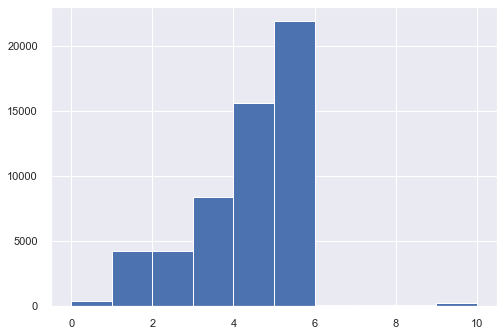

In [17]:
sns.set()
df['rating'].hist()

As we can see, not all ratings are an integers, and ratings range from 0 to 10, even though the majority fall within the range from 1-5

In [34]:
df['rating'].describe()

count    55050.000000
mean         3.879156
std          1.335002
min          0.000000
25%          3.000000
50%          4.000000
75%          5.000000
max         10.000000
Name: rating, dtype: float64

In [40]:
print("Number of ratings greater than 5:", df[df['rating'] > 5].shape[0])
print("Percent of ratings greater than 5:", df[df['rating'] > 5].shape[0] / df.shape[0])

Number of ratings greater than 5: 357
Percent of ratings greater than 5: 0.006385033624266705


There's only 0.6% of ratings greater than 5, and since the scales of these reviews are unclear (e.g., a 10-point review can be 10/10 or 10/100), we exclude them from subsequent analyses.

In [42]:
df = df[df['rating'] <= 5]

<h2> Average Ratings by Hotels </h2>

We first group the dataframe by hotels and then show the average ratings

In [76]:
hotel_grouped = df.groupby('name')
avg_rating = pd.DataFrame(hotel_grouped.mean()['rating'])
avg_rating

,rating
name,
11th Avenue Hotel Hostel,1.000000
1785 Inn,2.625000
1900 House,4.571429
1906 Lodge At Coronado Beach,5.000000
21c Museum Hotel Lexington,2.500000
...,...
Ye Olde Danish Inn,5.000000
Z Bar Motel,4.000000
dana hotel and spa,4.482609


We can look into the average rating distribution

array([[<AxesSubplot:title={'center':'rating'}>]], dtype=object)

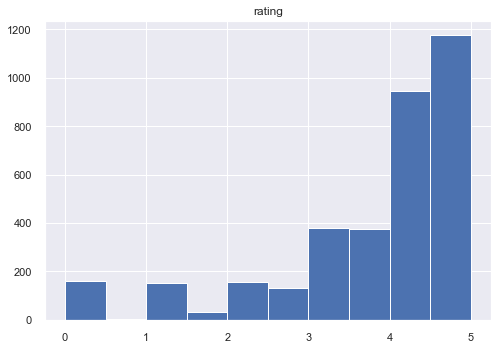

In [77]:
avg_rating.hist()

We want to sort the dataframe by average rating, so that we can show the five hotels with highest ratings and five hotels with lowest ratings

In [54]:
avg_rating.sort_values(by = 'rating').head()

,rating
name,
Robins Roost Cabins,0.0
Manor Vail Lodge,0.0
The Miner's Inn Motel Restaurant,0.0
Sky Vue Motel,0.0
Sir Walter Raleigh Inns of Greenbelt,0.0


In [55]:
avg_rating.sort_values(by = 'rating', ascending = False).head()

,rating
name,
Holiday Inn Express & Suites Helena,5.0
Kodiak Island Resort,5.0
Comfort Inn Red Hook,5.0
Comfort Inn South,5.0
Inn At Cannon Beach,5.0


We see that the five hotels with lowest ratings all have ratings of 0.0 and the five hotels with highest ratings all have ratings of 5.0. However, an average rating might be biased for hotels with only 1 rating. Thus, we look into the number of ratings for all hotels

In [57]:
avg_rating['num_rating'] = hotel_grouped.size()

In [58]:
avg_rating.sort_values(by = 'rating').head()

,rating,num_rating
name,,
Robins Roost Cabins,0.0,1
Manor Vail Lodge,0.0,3
The Miner's Inn Motel Restaurant,0.0,1
Sky Vue Motel,0.0,1
Sir Walter Raleigh Inns of Greenbelt,0.0,1


In [60]:
avg_rating.sort_values(by = 'rating', ascending = False).head()

,rating,num_rating
name,,
Holiday Inn Express & Suites Helena,5.0,1
Kodiak Island Resort,5.0,1
Comfort Inn Red Hook,5.0,1
Comfort Inn South,5.0,1
Inn At Cannon Beach,5.0,1


Indeed, we see that all these hotels with "lowest" and "highest" ratings only have 1 rating. We investigate this further

In [62]:
print("Number of hotels with more than 1 rating:", avg_rating[avg_rating['num_rating'] > 1].shape[0])
print("Number of hotels with more than 2 ratings:", avg_rating[avg_rating['num_rating'] > 2].shape[0])

Number of hotels with more than 1 rating: 2306
Number of hotels with more than 2 ratings: 1769


In fact, only 2,306 hotels out of 3,518 hotels have more than 1 rating and only 1,769 hotels have more than 2 ratings. If we were to only consider hotels with at least 2 ratings, the top and bottom hotels are as followed:

In [63]:
avg_rating[avg_rating['num_rating'] > 1].sort_values(by = 'rating').head()

,rating,num_rating
name,,
Central House,0.0,2
Comfort Suites South,0.0,3
Brasstown Valley Golf Club,0.0,2
Whiteface Chalet,0.0,2
Lindy Motel,0.0,2


In [64]:
avg_rating[avg_rating['num_rating'] > 1].sort_values(by = 'rating', ascending = False).head()

,rating,num_rating
name,,
The Hideout Lodge Guest Ranch,5.0,7
Hill Country Equestrian Lodge,5.0,2
Hilton Garden Inn Akron,5.0,2
Hampton Inn Easton,5.0,3
Doubletree by Hilton Hotel Reading,5.0,2


<h2> Hotel Categories </h2>

We start by counting the frequency of hotels categories

In [65]:
hotel_categories = df['categories'].str.split(",").explode()
hotel_categories.value_counts()

Hotels                             46483
Hotel                              26797
Lodging                            11094
Hotels Motels                       8257
Hotels and motels                   6847
                                   ...  
Ironwood                               1
Tn\\hotel Pool                         1
Halls Auditoriums and Ballrooms        1
Carpets and Rugs                       1
 and Building                          1
Name: categories, Length: 572, dtype: int64

However, we see that some categories clearly overlap (e.g., Hotels and hotel). Thus, we perform some text cleaning to collapse them. In particular, we lowercase and tokenize the category, remove stopwords, and convert each token to its base form via lemmatization. In addition, to remove special symbols such as &, we only consider categories that have at least two characters

In [68]:
import nltk
from nltk.stem.wordnet import WordNetLemmatizer 

nltk.download("stopwords", quiet = True)
lemmatizer = WordNetLemmatizer()
english_stopwords = set(nltk.corpus.stopwords.words('english'))

def clean_category(text):
    return [
        lemmatizer.lemmatize(token)
        for token in nltk.word_tokenize(text.lower())
        if token not in english_stopwords and len(token) > 1
    ]

hotel_categories = hotel_categories.apply(clean_category).explode()

<AxesSubplot:>

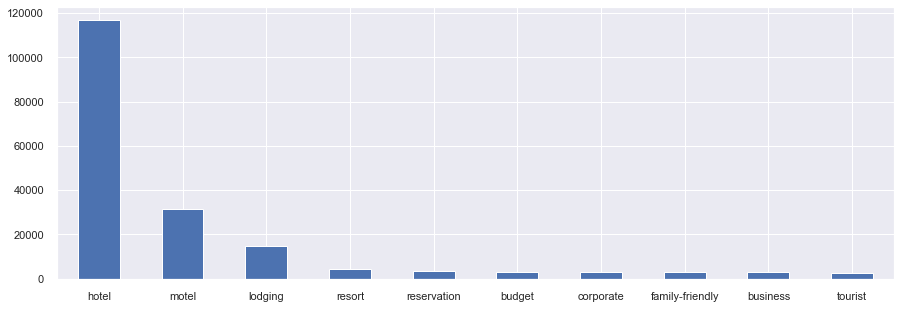

In [69]:
hotel_categories.value_counts().nlargest(10).plot(kind = "bar", rot = 0, figsize = (15, 5))

In [70]:
hotel_categories.value_counts().nlargest(10)

hotel              116923
motel               31340
lodging             14689
resort               4338
reservation          3280
budget               3194
corporate            3188
family-friendly      3152
business             3025
tourist              2665
Name: categories, dtype: int64

Showing the 10 most common hotel categories, we see that after hotel, motel and lodging on one hand and resort on another hand are also quite popular

<h2> Review dates </h2>

Presumably people would write their review to a hotel shortly after their stay, so looking at the review count at a particular time would provide some insights into a hotel's traffic at that time.

<ipython-input-72-b7c41cf69f80>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = pd.to_datetime(df['date']).dt.month


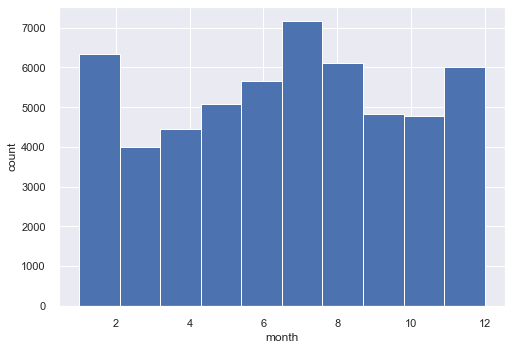

In [72]:
df['month'] = pd.to_datetime(df['date']).dt.month
ax = df['month'].hist()
ax.set_xlabel('month')
ax.set_ylabel('count');

We see that the three clear modes are in January, July and December. These three months correspond to the New Year holiday, summer holiday, and Christmas, so it makes sense that they yielded the highest number of guests and reviews.

<h2> Distribution of ratings by month </h2>

Could we try to see if hotels tend to get more ratings at certain times of the year than at other times?

In [82]:
month_rating_grouped = df.groupby(['month', 'rating'])
month_rating_grouped.size().unstack()

rating,0.00,1.00,1.25,1.30,1.45,1.50,1.65,1.90,2.00,2.10,...,4.25,4.30,4.40,4.50,4.60,4.70,4.75,4.80,4.90,5.00
month,,,,,,,,,,,,,,,,,,,,,
1.0,9.0,167.0,NaN,NaN,NaN,NaN,1.0,NaN,205.0,NaN,...,1.0,16.0,8.0,5.0,10.0,NaN,NaN,17.0,1.0,1372.0
2.0,7.0,213.0,NaN,NaN,1.0,NaN,NaN,NaN,197.0,1.0,...,NaN,3.0,10.0,NaN,9.0,NaN,NaN,13.0,NaN,1371.0
3.0,10.0,311.0,1.0,NaN,NaN,NaN,1.0,NaN,248.0,3.0,...,NaN,1.0,9.0,4.0,20.0,NaN,NaN,21.0,NaN,1692.0
4.0,4.0,330.0,NaN,1.0,1.0,NaN,2.0,NaN,332.0,NaN,...,NaN,NaN,10.0,NaN,10.0,NaN,NaN,15.0,2.0,1863.0
5.0,7.0,361.0,NaN,NaN,2.0,NaN,1.0,NaN,346.0,3.0,...,NaN,NaN,12.0,NaN,19.0,NaN,NaN,12.0,2.0,2038.0
6.0,13.0,499.0,NaN,NaN,2.0,1.0,NaN,NaN,439.0,NaN,...,NaN,NaN,11.0,1.0,12.0,1.0,NaN,23.0,NaN,2185.0
7.0,18.0,649.0,NaN,NaN,NaN,NaN,NaN,2.0,609.0,1.0,...,NaN,NaN,13.0,1.0,18.0,1.0,NaN,16.0,NaN,2656.0
8.0,22.0,512.0,NaN,NaN,NaN,NaN,NaN,1.0,513.0,1.0,...,1.0,NaN,8.0,NaN,26.0,1.0,1.0,23.0,1.0,2274.0
9.0,10.0,391.0,NaN,NaN,NaN,NaN,1.0,NaN,396.0,NaN,...,NaN,NaN,5.0,1.0,11.0,NaN,NaN,14.0,NaN,1934.0


In [15]:
df['review'] = df['title'] + df['text']
df['review']

0       Good location away from the croudsPleasant 10 ...
1       Great hotel with Jacuzzi bath!Really lovely ho...
2       Lugnt l��geEtt mycket bra hotell. Det som drog...
3       Good location on the Lido.We stayed here for f...
4       ������ ���������������We stayed here for four ...
                              ...                        
9995    Picture Window Ocean View!It is hard for me to...
9996    Clean, comfortable and quietI live close by, a...
9997    Passing throughRolled in 11:30 laid out heads ...
9998    TerribleAbsolutely terrible..I was told I was ...
9999    PoldeFilthy, outdated, noisy neighbours, but t...
Name: review, Length: 55027, dtype: object

In [16]:

import json
import geojsonio
import folium

from sklearn.model_selection import train_test_split

train, test = train_test_split(df, test_size = 0.3, random_state = 28)
train

,address,categories,city,country,latitude,longitude,name,postalCode,province,date,...,dateAdded,dateUpdated,primaryCategories,keys,reviews.dateSeen,reviews.sourceURLs,sourceURLs,websites,rating_int,review
5891,150 Malin Dr,"Motels,Hotels,Lodging,Corporate Lodging,Hotels...",Wytheville,US,36.946900,-81.053910,Days Inn - Wytheville,24382,VA,2015-10-26T00:00:00Z,...,2016-11-06T04:39:59Z,2018-03-18T19:38:55Z,Accommodation & Food Services,us/va/wytheville/150malindr/-345752555,2016-04-03T00:00:00Z,http://www.tripadvisor.com/Hotel_Review-g58337...,https://www.yellowpages.com/wytheville-va/mip/...,"http://www.daysinn.com,http://api.citygridmedi...",2,"location and staff were great! Room, not so mu..."
31022,12015 Harbor Blvd,Hotels,Garden Grove,US,33.788140,-117.916591,Anaheim Marriott Suites,92840,CA,2016-09-13T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,Love the GREAT service!!Room was not clean. Bl...
32808,88 E Nationwide Blvd,Hotels,Columbus,US,39.969219,-82.999881,Drury Inn and Suites Columbus Convention Center,43215,OH,2016-03-09T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,The best choice in the convention centerI've s...
5751,9700 N Torrey Pines Rd,"Resort,Budget Hotels,Resorts,Spa,Hotel, Resort...",La Jolla,US,32.884200,-117.245100,Estancia La Jolla Hotel and Spa,92037,CA,2013-05-28T00:00:00.000Z,...,2017-03-04T12:22:32Z,2019-03-21T11:03:44Z,Accommodation & Food Services,us/ca/lajolla/9700ntorreypinesrd/-1323280657,"2018-08-26T00:00:00Z,2018-11-11T00:00:00Z",https://www.tripadvisor.com/Hotel_Review-g3257...,https://www.tripadvisor.com/Hotel_Review-g3257...,"http://www.estancialajolla.com/,https://www.me...",5,"Great Vacation Hotel and SpaIn March 2013, I s..."
4205,249 York Street,"Hotels Motels,Hotel",Williamsburg,US,37.270315,-76.687513,"Bluegreen Vacations Patrick Henry Sqr, Ascend ...",23185,VA,2017-08-08T00:00:00.000Z,...,2017-09-01T10:05:04Z,2018-04-19T17:06:42Z,Accommodation & Food Services,us/va/williamsburg/249yorkstreet/-1043619478,2018-03-27T00:00:00Z,https://www.booking.com/reviews/us/hotel/patri...,https://www.booking.com/reviews/us/hotel/patri...,https://www.choicehotels.com/virginia/williams...,5,Awesome place to stay booking next year for mo...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5167,2310 Greenville Blvd NE,"Hotels,Lodging,Hotels Motels,Hotel",Greenville,US,35.602800,-77.331900,Best Western Plus Suites-Greenville,27858,NC,2016-05-23T00:00:00Z,...,2016-11-09T19:07:35Z,2019-03-31T08:30:51Z,Accommodation & Food Services,us/nc/greenville/2310greenvilleblvdne/-1623447950,2016-08-03T00:00:00Z,https://www.tripadvisor.com/Hotel_Review-g4918...,http://www.citysearch.com/profile/664677910/gr...,https://www.bestwestern.com/en_US/book/hotel-r...,5,Great StopoverWe stayed at the Best Western Pl...
7344,1755 Idaho St,Hotels,Elko,US,40.843764,-115.751013,Super 8 Elko Nv,89801,North Fork,2016-07-14T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,Not recommendedThe service was good at this ho...
26816,3107 Atlantic Ave,"Hotel,Hotels",Virginia Beach,US,36.859787,-75.978035,Hampton Inn Virginia Beach Oceanfront North,23451-2934,VA,2015-08-06T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,this location nevert again!!!!breakfast poor!....
4155,13600 N W 2nd St,Hotels,Fort Lauderdale,US,26.123981,-80.331315,La Quinta Inn and Suites Sunrise,33325,Plantation,2015-08-17T00:00:00Z,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,La quinta inn is a good choiceThe free breakfa...


In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
X_train = vectorizer.fit_transform(train['review'])

In [18]:
X_train.A

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [19]:
y_train = train['rating']
y_train

5891     2.0
31022    2.0
32808    4.0
5751     5.0
4205     5.0
        ... 
5167     5.0
7344     2.0
26816    6.3
4155     3.0
7213     5.0
Name: rating, Length: 38518, dtype: float64

In [20]:
X_test = vectorizer.transform(test['review'])
y_test = test['rating']
X_test.A

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [21]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error

linear_reg = linear_model.LinearRegression() # an empty model
linear_reg.fit(X_train,y_train)

LinearRegression()

In [22]:
linear_reg.coef_

array([-0.36885092, 30.49417593, -2.21267468, ...,  0.12303729,
        0.12303729,  0.09442497])

In [24]:
print("Training R-Square",linear_reg.score(X_train,y_train))
print("Testing R-Square",linear_reg.score(X_test,y_test))

Training R-Square 0.9508769432812644
Testing R-Square -4.954420534649888


In [25]:
y_lin_predicted = linear_reg.predict(X_test)
y_lin_predicted

array([0.15658696, 5.49265259, 5.77238215, ..., 2.89865311, 1.34298782,
       0.80612602])

In [26]:
mean_squared_error(y_test, y_lin_predicted)

10.557894465891465

In [131]:

from sklearn.tree import DecisionTreeRegressor

dct_reg = DecisionTreeRegressor(max_depth = 5)
dct_reg.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=5)

In [132]:
print("Training R-Square",dct_reg.score(X_train,y_train))
print("Testing R-Square",dct_reg.score(X_test,y_test))

Training R-Square 0.2599850510368168
Testing R-Square 0.24261100508672628


In [136]:
y_dct_predicted = dct_reg.predict(X_test)
y_dct_predicted

array([3.04575987, 3.96019464, 3.96019464, ..., 3.04575987, 3.96019464,
       3.04575987])

In [137]:
mean_squared_error(y_test, y_dct_predicted)

1.3429405987348744

In [139]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(max_depth = 5, random_state = 0)
rf_reg.fit(X_train, y_train)

RandomForestRegressor(max_depth=5, random_state=0)

In [140]:
print("Training R-Square",rf_reg.score(X_train,y_train))
print("Testing R-Square",rf_reg.score(X_test,y_test))

Training R-Square 0.27658896429728463
Testing R-Square 0.2599944593972583


In [141]:
y_rf_predicted = rf_reg.predict(X_test)
y_rf_predicted

array([3.07983435, 4.07627497, 3.91219521, ..., 3.03892767, 3.91219521,
       3.03892767])

In [142]:
mean_squared_error(y_test, y_rf_predicted)

1.312117670627054

In [ ]:
from sklearn import svm

svm_reg = svm.SVR()
svm_reg.fit(X_train, y_train)

In [ ]:
print("Training R-Square",svm_reg.score(X_train,y_train))
print("Testing R-Square",svm_reg.score(X_test,y_test))

In [ ]:
y_svm_predicted = svm_reg.predict(X_test)
y_svm_predicted

In [ ]:
mean_squared_error(y_test, y_svm_predicted)

In [27]:
from sklearn.neighbors import KNeighborsRegressor

knn_reg = KNeighborsRegressor(n_neighbors = 2)
knn_reg.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=2)

In [28]:
print("Training R-Square",knn_reg.score(X_train,y_train))
print("Testing R-Square",knn_reg.score(X_test,y_test))

Training R-Square 0.7624025785381405
Testing R-Square -0.11249171751536058


In [29]:
y_knn_predicted = knn_reg.predict(X_test)
y_knn_predicted

array([4.5, 4.5, 4.5, ..., 5. , 4.5, 4.5])

In [30]:
mean_squared_error(y_test, y_knn_predicted)

1.9725798806711492

In [31]:
text=''
for rev in df['review']:
    text += rev
text

'Good location away from the croudsPleasant 10 min walk along the sea front to the Water Bus. restaurants etc. Hotel was comfortable breakfast was good - quite a variety. Room aircon didn\'t work very well. Take mosquito repelant!Great hotel with Jacuzzi bath!Really lovely hotel. Stayed on the very top floor and were surprised by a Jacuzzi bath we didn\'t know we were getting! Staff were friendly and helpful and the included breakfast was great! Great location and great value for money. Didn\'t want to leave!Lugnt l��geEtt mycket bra hotell. Det som drog ner betyget var att vi fick ett rum under taksarna dr det endast var full sthjd i 80 av rummets yta.Good location on the Lido.We stayed here for four nights in October. The hotel staff were welcoming, friendly and helpful. Assisted in booking tickets for the opera. The rooms were clean and comfortable- good shower, light and airy rooms with windows you could open wide. Beds were comfortable. Plenty of choice for breakfast.Spa at hotel 

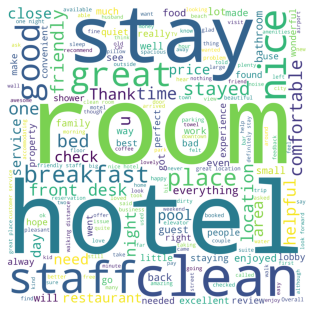

In [34]:
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(stopwords = STOPWORDS, background_color = 'white',width = 3000,height = 3000).generate(text)

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [42]:
hyatt_reviews = df[df['name'] == 'Hyatt Regency Kathmandu']['review']
hyatt_text = ''
for rev in hyatt_reviews:
    hyatt_text += rev
#hyatt_text

In [44]:
pelican_reviews = df[df['name'] == 'Pelican Shores Inn']['review']
pelican_text = ''
for rev in pelican_reviews:
    pelican_text += rev
#pelican_text

In [45]:
candlewood_reviews = df[df['name'] == 'Candlewood Suites Eugene Springfield']['review']
candlewood_text = ''
for rev in candlewood_reviews:
    candlewood_text += rev

In [46]:
hampton_reviews = df[df['name'] == 'Hampton Inn Virginia Beach Oceanfront North']['review']
hampton_text = ''
for rev in hampton_reviews:
    hampton_text += rev

In [47]:
top_hotels = [('hyatt', hyatt_text),('pelican', pelican_text)
                  ,('candlewood', candlewood_text), ('hampton',hampton_text)]

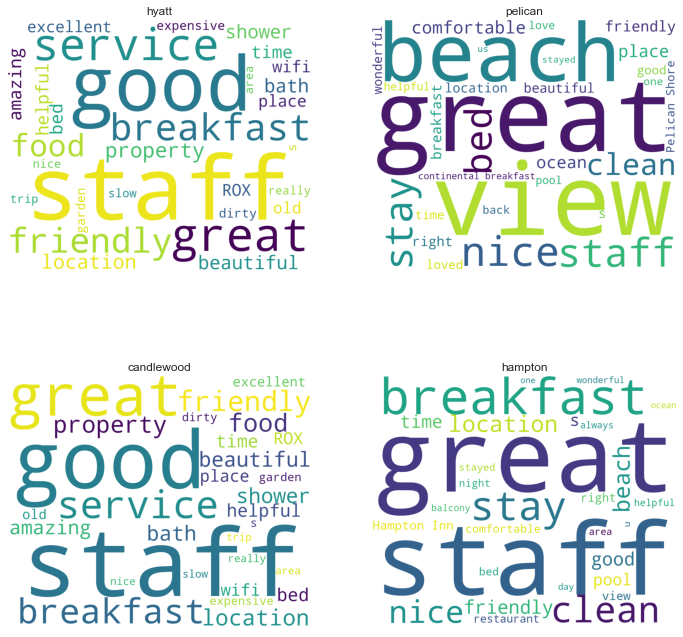

In [51]:
texts = top_hotels

DELETE_WORDS = ['hotel', 'room']
def remove_words(text_string, DELETE_WORDS = DELETE_WORDS):
    for word in DELETE_WORDS:
        text_string = text_string.replace(word,' ')
    return text_string

#Remove short words
MIN_LENGTH = 0
def remove_short_words(text_string,min_length = MIN_LENGTH):
    word_list = text_string.split()
    for word in word_list:
        if len(word) < min_length:
            text_string = text_string.replace(' '+word+' ',' ',1)
    return text_string


#Set up side by side clouds
COL_NUM = 2
ROW_NUM = 2
fig, axes = plt.subplots(ROW_NUM, COL_NUM, figsize=(12,12))

for i in range(0,len(texts)):
    text_string = remove_words(texts[i][1])
    text_string = remove_short_words(text_string)
    ax = axes[i//2, i%2] 
    ax.set_title(texts[i][0])
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color='white',width=1200,height=1000,max_words=30).generate(text_string)
    ax.imshow(wordcloud)
    ax.axis('off')
plt.show()

In [75]:
hotel_rating_grouped = df.groupby(['name', 'rating'])
hotel_rating_df = hotel_rating_grouped.size().unstack()
hotel_rating_df

rating,0.00,1.00,1.25,1.30,1.45,1.50,1.65,1.90,2.00,2.10,...,7.00,7.10,7.50,7.90,8.30,8.80,9.20,9.50,9.60,10.00
name,,,,,,,,,,,,,,,,,,,,,
11th Avenue Hotel Hostel,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1785 Inn,4.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1900 House,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1906 Lodge At Coronado Beach,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21c Museum Hotel Lexington,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ye Olde Danish Inn,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Z Bar Motel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dana hotel and spa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
def createGeoJsonObject(df):
    points_dict = dict()
    points_dict['type'] = 'FeatureCollection'
    points_dict_features = list()
    points_dict['features'] = points_dict_features
    
    # Iterate through all the (lat,long) pairs
    for idx, row in df.iterrows():
        
        item = dict()
        item['type'] = 'Feature'
        
        # Assign point ids
        item['properties'] = {'point_id' : idx}
        
        # Assign point coordinates
        geometry = dict()
        geometry['type'] = 'Point'
        
        lat = row['latitude']
        long = row['longitude']
        
        geometry['coordinates'] = [long, lat]
        
        item['geometry'] = geometry
        
        points_dict_features.append(item)
        
    return points_dict

In [45]:
hotels_json = createGeoJsonObject(df)

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'point_id': 0},
   'geometry': {'type': 'Point', 'coordinates': [12.376187, 45.421611]}},
  {'type': 'Feature',
   'properties': {'point_id': 1},
   'geometry': {'type': 'Point', 'coordinates': [12.376187, 45.421611]}},
  {'type': 'Feature',
   'properties': {'point_id': 2},
   'geometry': {'type': 'Point', 'coordinates': [12.376187, 45.421611]}},
  {'type': 'Feature',
   'properties': {'point_id': 3},
   'geometry': {'type': 'Point', 'coordinates': [12.376187, 45.421611]}},
  {'type': 'Feature',
   'properties': {'point_id': 4},
   'geometry': {'type': 'Point', 'coordinates': [12.376187, 45.421611]}},
  {'type': 'Feature',
   'properties': {'point_id': 5},
   'geometry': {'type': 'Point', 'coordinates': [12.376187, 45.421611]}},
  {'type': 'Feature',
   'properties': {'point_id': 6},
   'geometry': {'type': 'Point', 'coordinates': [12.376187, 45.421611]}},
  {'type': 'Feature',
   'properties': {'point_i

In [ ]:
m = folium.Map(location = [12.376187, 45.421611],zoom_start = 10)
m.choropleth(geo_data = hotels_json, data = sizes,
             columns =['Pick-up Zone', 'Number of Pickups'],
             key_on = 'feature.properties.point_id',
             fill_color = 'RdYlGn', fill_opacity = 0.7, line_opacity = 0.8,
             legend_name = 'Distribution of Incidents')
folium.LayerControl().add_to(m)

m